<a href="https://colab.research.google.com/github/Jose1488/FINAL-PROJECT/blob/main/Project15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pycryptodome

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 14.1 MB/s eta 0:00:00


In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

Upload gambar untuk enkripsi:


Saving Naomi .jpg to Naomi .jpg
Gambar asli:


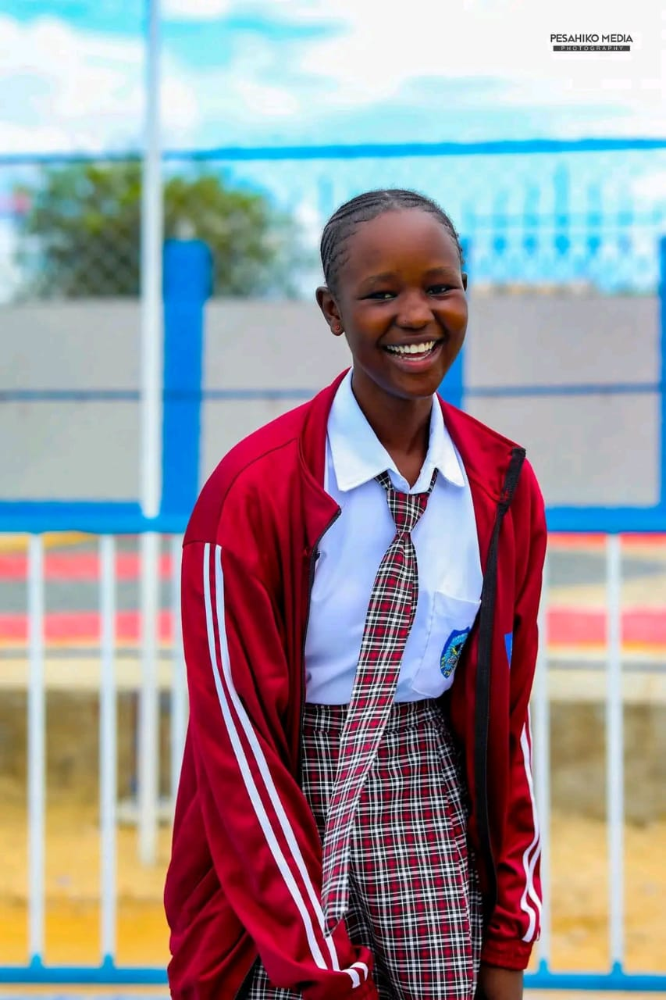

In [3]:
#Function to encrypt image using XOR
def xor_encrypt_decrypt(image, key):
    # Membuat kunci yang seukuran dengan gambar
    key_matrix = np.full(image.shape, key, dtype=np.uint8)
    # Menggunakan XOR untuk enkripsi/dekripsi
    encrypted_image = cv2.bitwise_xor(image, key_matrix)
    return encrypted_image

# Upload gambar untuk enkripsi
print("Upload gambar untuk enkripsi:")
uploaded_image = files.upload()
image_path = list(uploaded_image.keys())[0]
image = cv2.imread(image_path)

# Tampilkan gambar asli
print("Gambar asli:")
cv2_imshow(image)

In [4]:
# Specify encryption key (can be a number or another byte)
key = 123456 # Simple encryption key, can change this value

Gambar setelah dienkripsi:


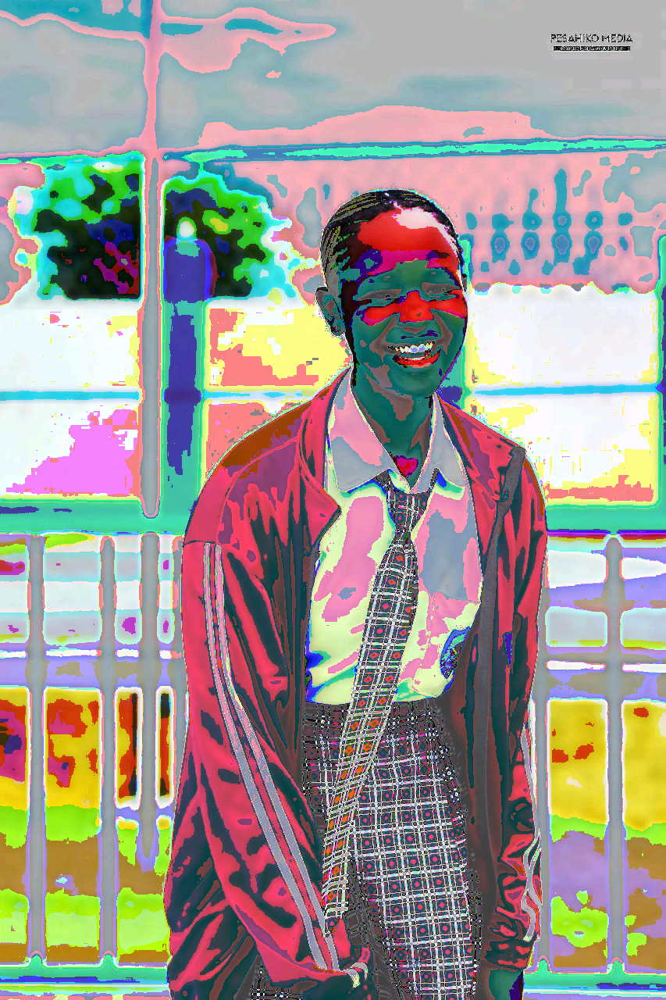

Gambar yang sudah dienkripsi disimpan sebagai encrypted_image.png


In [5]:
# Enkripsi gambar
encrypted_image = xor_encrypt_decrypt(image, key)

# Tampilkan gambar yang sudah dienkripsi
print("Gambar setelah dienkripsi:")
cv2_imshow(encrypted_image)

# Simpan gambar hasil enkripsi
encrypted_image_path = "encrypted_image.png"
cv2.imwrite(encrypted_image_path, encrypted_image)
print(f"Gambar yang sudah dienkripsi disimpan sebagai {encrypted_image_path}")

Gambar setelah didekripsi:


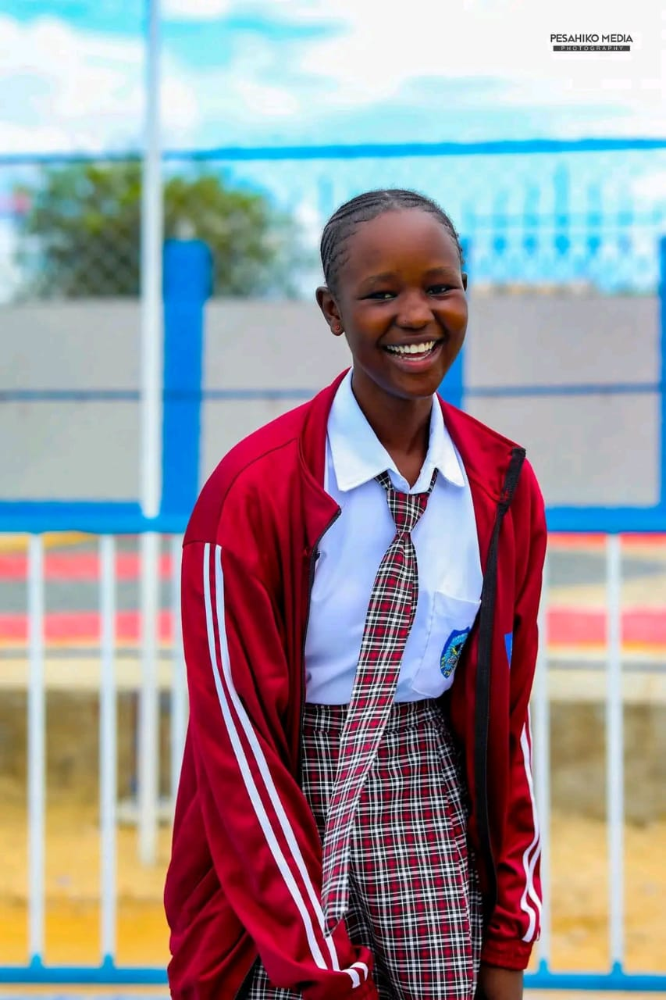

In [6]:
# Dekripsi gambar menggunakan kunci yang sama
decrypted_image = xor_encrypt_decrypt(encrypted_image, key)

# Tampilkan gambar hasil dekripsi (untuk memverifikasi)
print("Gambar setelah didekripsi:")
cv2_imshow(decrypted_image)

Steganografi

In [7]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

In [8]:
# Fungsi untuk menyisipkan pesan (encoding)
def lsb_encode(cover_image, secret_message):
    # Konversi pesan menjadi bit
    message_bits = ''.join(format(ord(char), '08b') for char in secret_message) + '00000000'
    encoded_image = cover_image.copy()
    data_index = 0

    for row in encoded_image:
        for pixel in row:
            for channel in range(3):  # Iterasi tiap channel warna (B, G, R)
                if data_index < len(message_bits):
                    pixel[channel] = (pixel[channel] & ~1) | int(message_bits[data_index])
                    data_index += 1
                else:
                    break

    return encoded_image

In [9]:
# Fungsi untuk mengekstraksi pesan (decoding)
def lsb_decode(encoded_image):
    message_bits = []
    for row in encoded_image:
        for pixel in row:
            for channel in range(3):  # Iterasi tiap channel warna (B, G, R)
                message_bits.append(pixel[channel] & 1)

    # Mengonversi bit ke teks
    message_bytes = [message_bits[i:i + 8] for i in range(0, len(message_bits), 8)]
    secret_message = ''.join(chr(int(''.join(map(str, byte)), 2)) for byte in message_bytes)

    # Menghapus padding null karakter
    return secret_message.split('\x00', 1)[0]

Upload gambar cover:


Saving WhatsApp Image 2024-04-02 at 01.22.25_4bab3953.jpg to WhatsApp Image 2024-04-02 at 01.22.25_4bab3953.jpg
Gambar Cover:


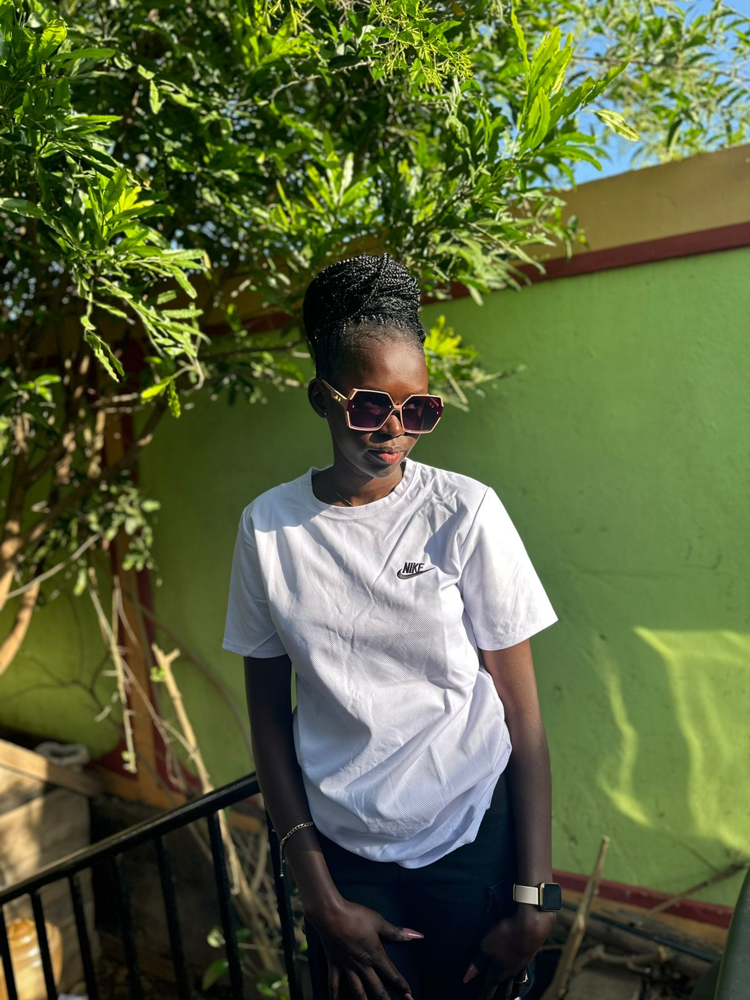

In [10]:
# Upload gambar cover
print("Upload gambar cover:")
uploaded_cover = files.upload()
cover_path = list(uploaded_cover.keys())[0]
cover_image = cv2.imread(cover_path)

# Tampilkan gambar cover
print("Gambar Cover:")
cv2_imshow(cover_image)

In [11]:
# Input pesan rahasia
secret_message = input("Masukkan pesan rahasia: ")

Masukkan pesan rahasia: sandipohon


Proses encoding selesai!
Gambar dengan pesan rahasia:


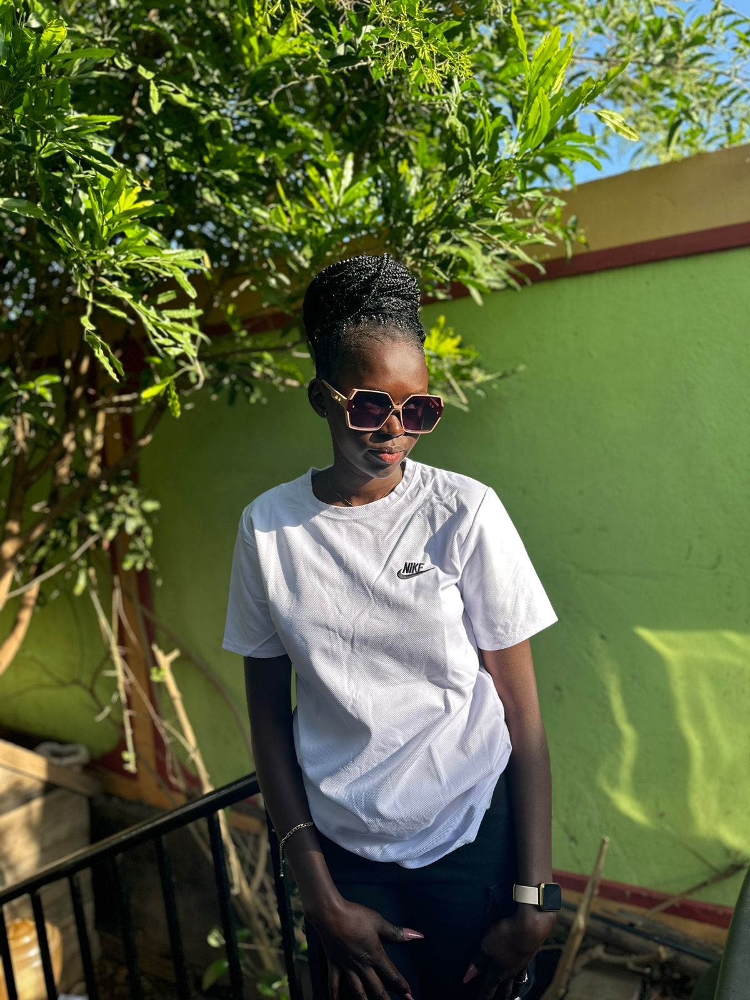

In [12]:
# Proses encoding
encoded_image = lsb_encode(cover_image, secret_message)
print("Proses encoding selesai!")
print("Gambar dengan pesan rahasia:")
cv2_imshow(encoded_image)

In [13]:
# Simpan gambar hasil encoding
encoded_path = "encoded_image.png"
cv2.imwrite(encoded_path, encoded_image)
print(f"Gambar hasil encoding disimpan sebagai {encoded_path}")

Gambar hasil encoding disimpan sebagai encoded_image.png


In [15]:
# Proses decoding
decoded_message = lsb_decode(encoded_image)
print(f"Pesan rahasia yang disisipkan: {decoded_message}")

Pesan rahasia yang disisipkan: sandipohon


Digital Watermarking

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [17]:
# Fungsi untuk menyisipkan watermark ke dalam gambar menggunakan LSB
def insert_watermark(image, watermark, bit_position=0):
    # Mengubah watermark menjadi gambar biner
    watermark = cv2.resize(watermark, (image.shape[1], image.shape[0]))  # Sesuaikan ukuran watermark dengan gambar
    if len(watermark.shape) == 3:  # Jika gambar watermark masih berwarna (RGB)
        watermark = watermark[:, :, 0]  # Ambil hanya kanal pertama (grayscale)

    # Menyisipkan watermark ke dalam bit terendah dari gambar
    watermark_bin = np.unpackbits(watermark.astype(np.uint8), axis=None)  # Mengubah watermark ke dalam bentuk biner
    image_flat = image.flatten()  # Meratakan gambar ke dalam vektor
    image_flat_with_watermark = image_flat.copy()

    for i in range(len(watermark_bin)):
        image_flat_with_watermark[i] = (image_flat_with_watermark[i] & 0xFE) | watermark_bin[i]

    # Mengembalikan gambar dengan watermark
    watermarked_image = np.reshape(image_flat_with_watermark, image.shape)
    return watermarked_image

In [18]:
# Fungsi untuk mengekstrak watermark dari gambar yang sudah di-watermark
def extract_watermark(watermarked_image, original_image):
    # Meratakan kedua gambar
    original_image_flat = original_image.flatten()
    watermarked_image_flat = watermarked_image.flatten()

    # Mengekstrak watermark dengan cara membandingkan bit terendah
    extracted_watermark = []
    for i in range(len(original_image_flat)):
        extracted_bit = watermarked_image_flat[i] & 1  # Mengambil bit terendah
        extracted_watermark.append(extracted_bit)

    # Mengonversi hasil ekstraksi biner menjadi gambar
    extracted_watermark = np.array(extracted_watermark).reshape(original_image.shape)
    return extracted_watermark